## Task 20 - Supervised Learning - Decision Trees

In this task we create a decision tree that can predict the survival of passengers on the
Titanic.

In [1]:
import numpy as np
import pandas as pd

from sklearn.preprocessing import LabelEncoder, OneHotEncoder, StandardScaler
from sklearn.model_selection import train_test_split
from sklearn.tree import DecisionTreeClassifier
from sklearn import tree
from sklearn.metrics import accuracy_score

# for visualisation
import matplotlib.pyplot as plt
from sklearn.tree import export_graphviz
from IPython.display import Image  
from subprocess import call, check_call
import pydot, graphviz

Import the titanic.csv dataset - note that exploratory data analysis was conducted on this dataset in task 15

In [2]:
df = pd.read_csv("titanic.csv")
df.head()

,PassengerId,Survived,Pclass,Name,Sex,Age,SibSp,Parch,Ticket,Fare,Cabin,Embarked
0,1,0,3,"Braund, Mr. Owen Harris",male,22.0,1,0,A/5 21171,7.2500,NaN,S
1,2,1,1,"Cumings, Mrs. John Bradley (Florence Briggs Th...",female,38.0,1,0,PC 17599,71.2833,C85,C
2,3,1,3,"Heikkinen, Miss. Laina",female,26.0,0,0,STON/O2. 3101282,7.9250,NaN,S
3,4,1,1,"Futrelle, Mrs. Jacques Heath (Lily May Peel)",female,35.0,1,0,113803,53.1000,C123,S
4,5,0,3,"Allen, Mr. William Henry",male,35.0,0,0,373450,8.0500,NaN,S


### Pre-processing

In [3]:
# We can drop 'PassengerId', 'Name', and 'Ticket' and 'Cabin' as they are not categorial or numerical and not needed for this task, 
# besides 'Cabin' also has too many missing values.
df=df.drop(['PassengerId', 'Name', 'Ticket', 'Cabin' ], axis=1)

df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 891 entries, 0 to 890
Data columns (total 8 columns):
 #   Column    Non-Null Count  Dtype  
---  ------    --------------  -----  
 0   Survived  891 non-null    int64  
 1   Pclass    891 non-null    int64  
 2   Sex       891 non-null    object 
 3   Age       714 non-null    float64
 4   SibSp     891 non-null    int64  
 5   Parch     891 non-null    int64  
 6   Fare      891 non-null    float64
 7   Embarked  889 non-null    object 
dtypes: float64(2), int64(4), object(2)
memory usage: 55.8+ KB


The .info() shows that some of the 'Age' and 'Embarked' variable data is missing so here we impute these missing values with the median and mode respectively.

In [4]:
df["Age"] = df["Age"].replace(np.NaN, df["Age"].median())
df["Embarked"] = df["Embarked"].replace(np.NaN, df["Embarked"].mode()[0])

### Categorical encoding

Next, we use onehot encoding for the 'Sex' and 'Embarked' variables, so that the resulting dataframe is fully numeric and suitable for machine learning.

In [5]:
cat_vars=df[['Sex','Embarked']]

# Instantiating the OneHot Encoder class
ohe = OneHotEncoder(sparse_output=False)

# Encoding the Text
cat_vars_onehot = ohe.fit_transform(cat_vars)

# List of categorical variables
categorical_columns = df.select_dtypes(include=['object']).columns.tolist()

#Create a DataFrame with the one-hot encoded columns
#We use get_feature_names_out() to get the column names for the encoded data
cat_vars = pd.DataFrame(cat_vars_onehot, columns=ohe.get_feature_names_out(categorical_columns))

Here we select 'Survived' as the target variable and the remaining varibles form the independent varibles.

In [6]:
num_features= df.drop(['Survived','Sex','Embarked'],axis=1)

X = pd.concat([num_features,cat_vars], axis=1)
y = df['Survived']

### Test train development split

Here we split the data into a training, development, and test sets.

In [7]:
rand = 42

# Split the original dataset into training and test sets
X_train_full, X_test, y_train_full, y_test = train_test_split(X, y, test_size=0.2, random_state=rand)

# Split the training set further into training and development sets
X_train, X_dev, y_train, y_dev = train_test_split(X_train_full, y_train_full, test_size=0.2, random_state=rand)

### Fitting a decision tree

Here we fit a decision tree to the training set and make a plot of it. Note that we use a classifier tree as the target variable is binary and we do not impose any restrictions on the depth of the tree.

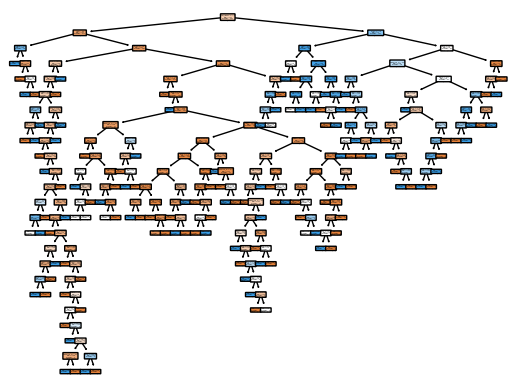

In [8]:
# training a model without pruning
unpruned = DecisionTreeClassifier(max_depth=None, random_state=rand)
unpruned.fit(X_train, y_train)

features = X_train.columns
tree.plot_tree(unpruned,feature_names = features, rounded = True, proportion = False, precision = 2, filled = True)
plt.show()

Here we compute the model’s accuracy on the *development* set

In [9]:
#Make predictions and compute the model accuracy on the development set.
y_dev_pred = unpruned.predict(X_dev)
print(f'Accuracy for model without pruning on the development set: {accuracy_score(y_dev, y_dev_pred)*100:.2f}%')
print("At depth:", unpruned.tree_.max_depth)

# We can also use the sklearn.tree in-built score function to give the same result
accuracy = unpruned.score(X_dev, y_dev)*100
print(f"\nAccuracy for model without pruning on the development set: {accuracy:.2f}%")
print("At depth:", unpruned.tree_.max_depth)

Accuracy for model without pruning on the development set: 77.62%
At depth: 23

Accuracy for model without pruning on the development set: 77.62%
At depth: 23


### Model tuning

Next, we perform hyperparameter tuning on the max_depth of the tree. We build a decision tree model with different values of max_depth from 2–10. At each step we create a plot of the decision tree and store the accuracies on both the
training and development data.

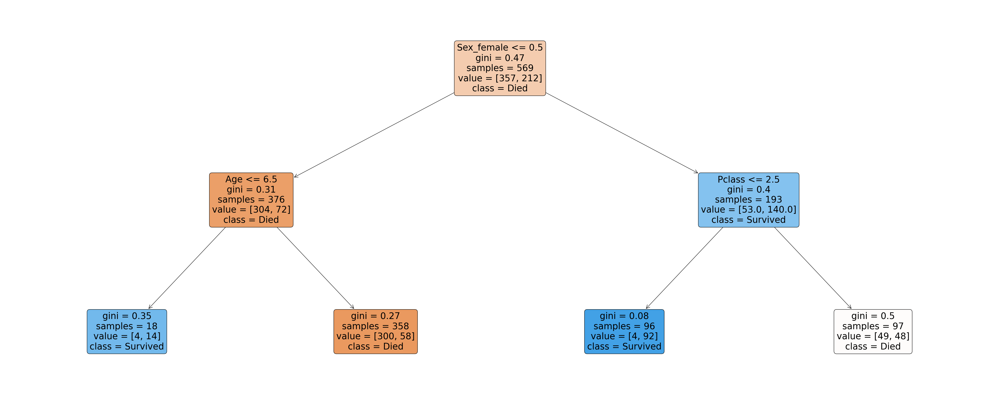

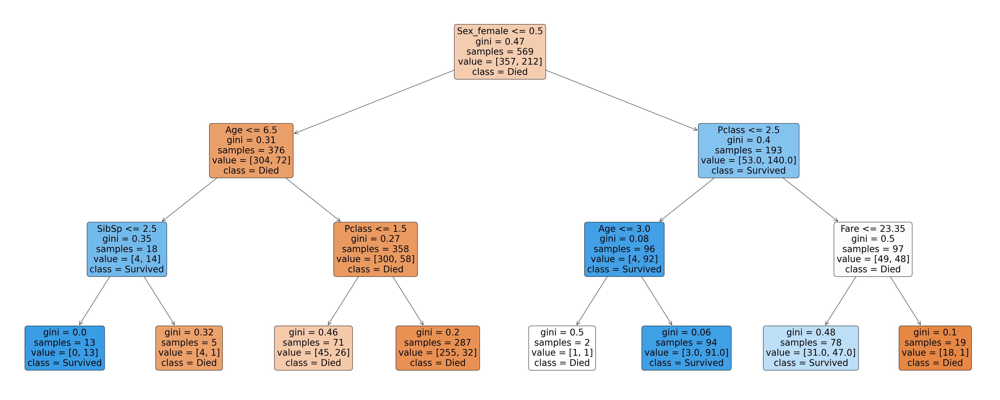

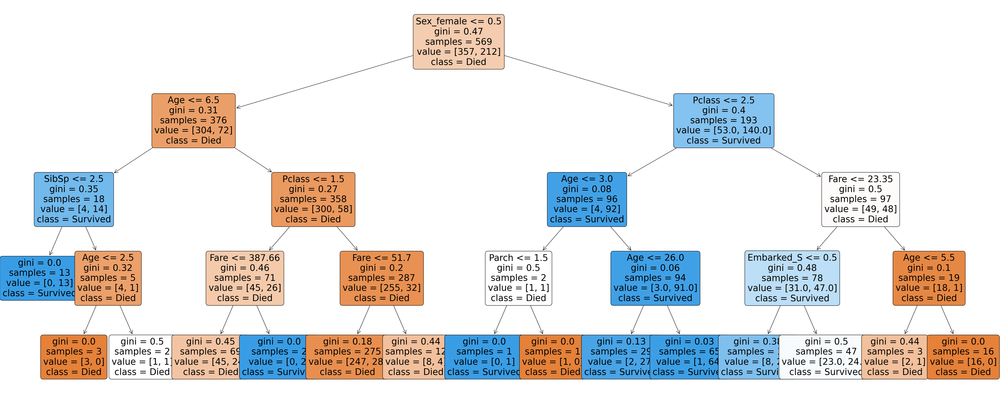

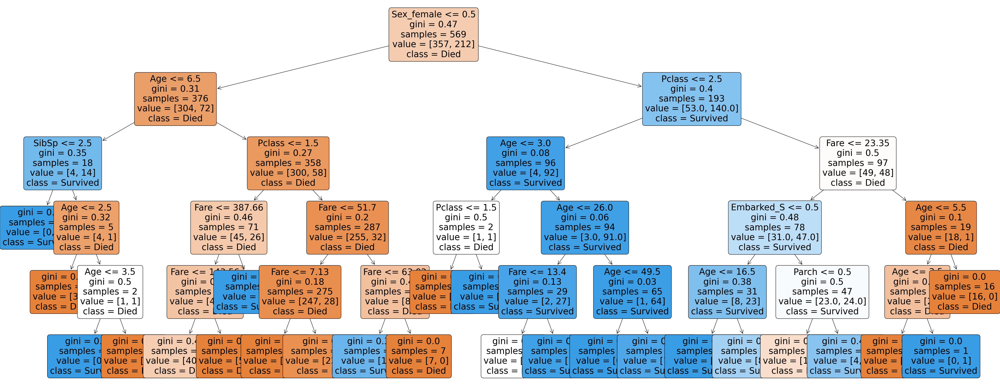

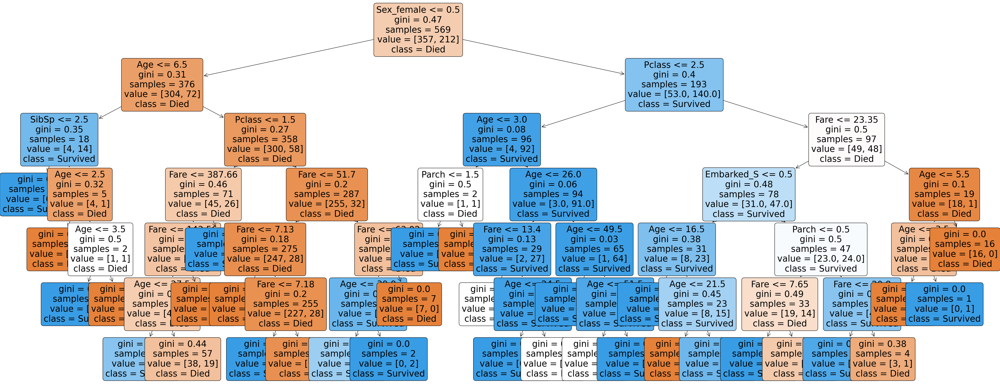

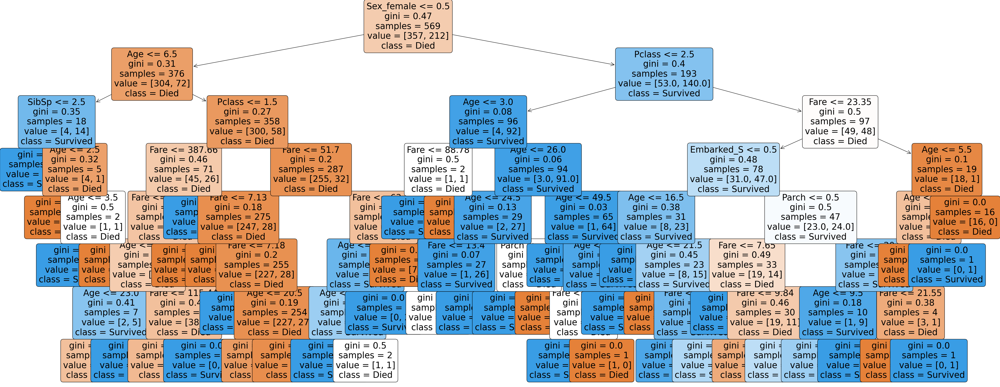

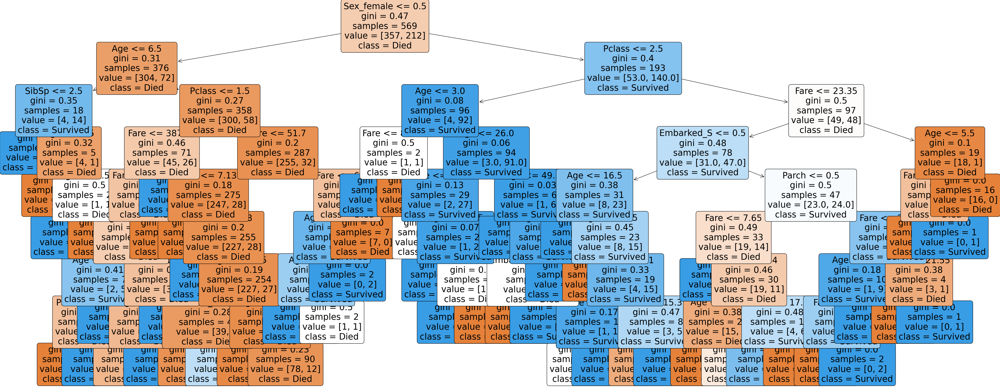

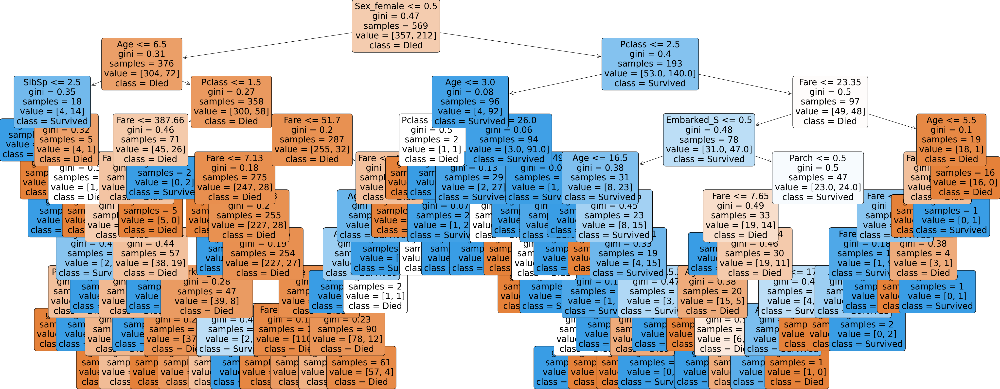

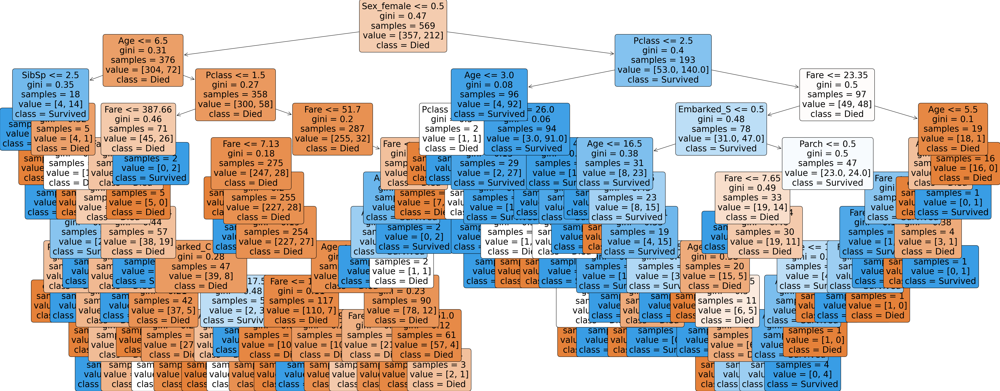

In [10]:
# looking at effect of pruning   
pruned_depths = range(2,11)

classes = ['Died','Survived']

pruned_train_scores = []
pruned_dev_scores = [] 
for depth in pruned_depths:
  clf = DecisionTreeClassifier(max_depth=depth, random_state=rand)
  clf.fit(X_train, y_train)
  plt.figure(figsize=(50,20))
  tree.plot_tree(clf,feature_names = features, class_names=classes, rounded = True, proportion = False, precision = 2, filled = True, fontsize=25)
  plt.show()
  score = clf.score(X_train, y_train)
  pruned_train_scores.append(score)
  score = clf.score(X_dev, y_dev)
  pruned_dev_scores.append(score)

Next, we plot a line of the training accuracies and development accuracies on the same graph. 

On the training set the accuracy is monotonically increasing, wheras on the development set the accuracy has a maximum. This is becuase the model overfits to the training data and as a result starts to underperform on the development data.

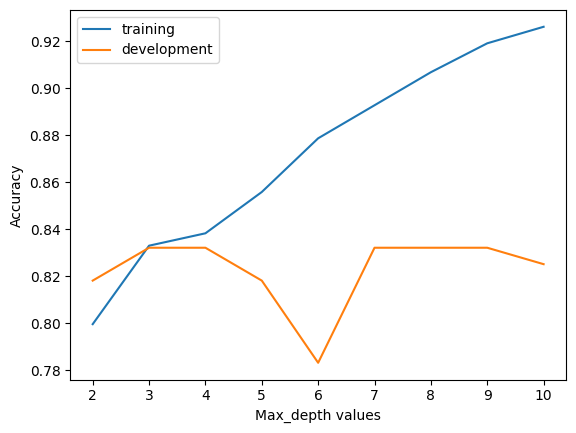

In [11]:
fig, ax = plt.subplots()
ax.plot(pruned_depths, np.c_[pruned_train_scores,pruned_dev_scores], label=['training', 'development'])
plt.xlabel("Max_depth values")
plt.ylabel("Accuracy")
ax.xaxis.set_ticks(pruned_depths)
plt.legend()
plt.show()

Finally, we find the depth with the highest accuracy and fit a decision tree with this depth to the training data. 
We then report the accuracy of this tuned final model on the *test* data.

In [12]:
# fitting the chosen tree
best_depth = pruned_depths[np.argmax(pruned_dev_scores)]
print('Best performance reached at depth of:', best_depth)

pruned = DecisionTreeClassifier(max_depth=best_depth)
pruned.fit(X_train, y_train)
accuracy = pruned.score(X_test, y_test)*100

print(f"Performance with pruning is {accuracy:.2f}% at depth",pruned.tree_.max_depth)

Best performance reached at depth of: 3
Performance with pruning is 79.89% at depth 3


### Visualisation 

Here we visualise the final model using export_graphviz and save as a .png file

In [13]:
tree.export_graphviz(pruned, out_file='pruned_tree.dot', feature_names = features, class_names=classes,
                  rounded = True, proportion = False, precision = 2, filled = True)
  
# Convert to png using pydot command
(graph,) = pydot.graph_from_dot_file("pruned_tree.dot")
graph.write_png("pruned_tree.png")